# import Lib

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


import seaborn as sns
import matplotlib.cm as cm


from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import json
import pickle

from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer

# ---- Kmeans

In [2]:
data1 = pd.read_csv('data_selected.csv')
data1.head(10)

,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score
0,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,33,32,22,2,0,14,66,0,2.63
1,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,34,34,13,14,100,12,61,2,1.72
2,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,37,27,6,3,50,10,1,0,3.17
3,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,52,10,28,12,100,10,0,1,1.86
4,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,38,11,29,13,100,15,9,1,1.25
5,IT,Male,43,Manager,2016-08-14 08:03:05.556036,8,High School,3,7800.0,46,31,8,0,100,15,95,0,2.77
6,IT,Male,37,Technician,2023-08-28 08:03:05.556036,1,Bachelor,5,5250.0,55,20,29,2,0,16,27,0,4.46
7,Engineering,Female,55,Engineer,2014-10-27 08:03:05.556036,9,Bachelor,2,7200.0,42,46,7,8,100,7,64,0,2.09
8,Marketing,Female,55,Technician,2023-06-29 08:03:05.556036,1,High School,2,4200.0,51,23,21,14,0,1,0,1,1.44
9,Engineering,Female,45,Consultant,2016-12-23 08:03:05.556036,7,Bachelor,1,6050.0,41,33,2,6,75,4,53,2,2.93


In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89990 entries, 0 to 89989
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Department                   89990 non-null  object 
 1   Gender                       89990 non-null  object 
 2   Age                          89990 non-null  int64  
 3   Job_Title                    89990 non-null  object 
 4   Hire_Date                    89990 non-null  object 
 5   Years_At_Company             89990 non-null  int64  
 6   Education_Level              89990 non-null  object 
 7   Performance_Score            89990 non-null  int64  
 8   Monthly_Salary               89990 non-null  float64
 9   Work_Hours_Per_Week          89990 non-null  int64  
 10  Projects_Handled             89990 non-null  int64  
 11  Overtime_Hours               89990 non-null  int64  
 12  Sick_Days                    89990 non-null  int64  
 13  Remote_Work_Freq

In [4]:
data = data1.drop(['Department','Gender','Job_Title','Hire_Date','Education_Level'], axis=1)

In [5]:
num_columns = data.select_dtypes(include=['int64', 'float64']).columns
data_num_columns = data[num_columns]
data_num_columns

,Age,Years_At_Company,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score
0,55,2,5,6750.0,33,32,22,2,0,14,66,0,2.63
1,29,0,5,7500.0,34,34,13,14,100,12,61,2,1.72
2,55,8,3,5850.0,37,27,6,3,50,10,1,0,3.17
3,48,7,2,4800.0,52,10,28,12,100,10,0,1,1.86
4,36,3,2,4800.0,38,11,29,13,100,15,9,1,1.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...
89985,56,0,1,6600.0,57,29,27,14,75,5,22,1,4.01
89986,27,1,4,4900.0,55,46,5,3,75,16,48,2,1.28
89987,53,8,2,4800.0,31,13,6,5,0,5,87,1,2.60
89988,22,9,5,8250.0,35,43,10,1,75,2,31,1,3.10


In [6]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

In [7]:
pca = PCA()
pca.fit(data_scaled)


PCA()

Text(0, 0.5, 'Eigenvalues')

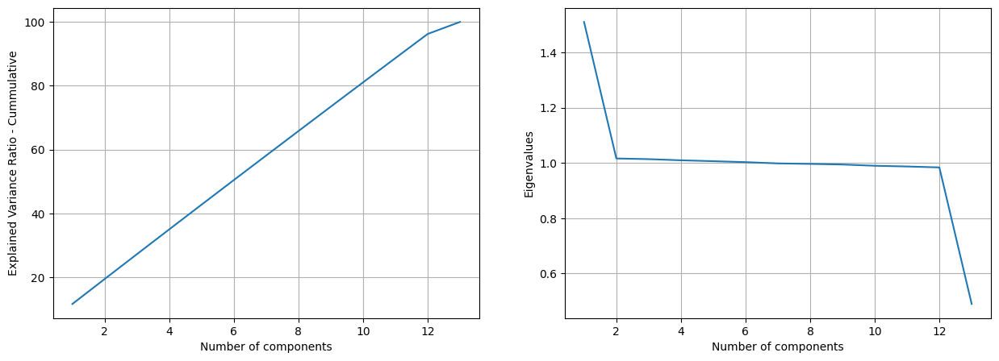

In [8]:
# Plot the Cummulative of Explained Variance Ratio
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(range(1, 14), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained Variance Ratio - Cummulative')

# Plot the Eigenvalues
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(range(1, 14), pca.explained_variance_ )
plt.xlabel('Number of components')
plt.ylabel('Eigenvalues')

In [9]:
# Check the number of features if we want to retain 75 % of the information

cumsum = np.cumsum(pca.explained_variance_ratio_)
num_features = np.argmax(cumsum >= 0.95) + 1
num_features

12

In [10]:
# Let's train the model with 95 % of the original dataset information

pca = PCA(n_components=0.95)
pca.fit(data_scaled)

data_scaled_pca = pca.transform(data_scaled)

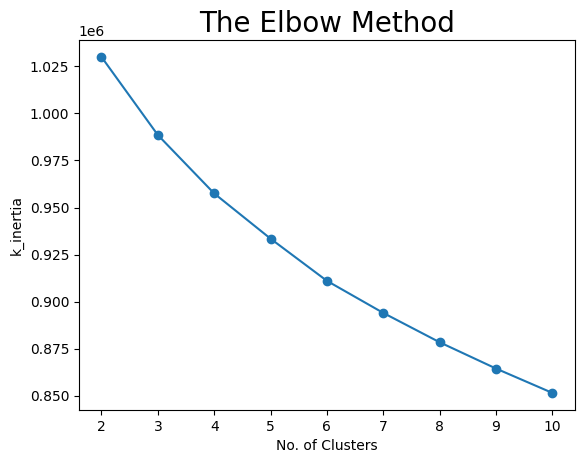

In [11]:
k_inertia = []
#membuat iterasi dari 2-10 untuk nilai k terbaik
for i in range(2, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 3)
    km.fit(data_scaled_pca)
    k_inertia.append(km.inertia_)

plt.plot(range(2, 11), k_inertia, marker ="o")
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('k_inertia')
plt.show()

In [12]:
# Function to create Silhouette Plot

import matplotlib.cm as cm
from sklearn.metrics import silhouette_score,silhouette_samples

def plot_silhouette(range_n_clusters, X, random_state):
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 4)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters = n_clusters, init = 'k-means++', max_iter = 300, n_init = 10, random_state = random_state)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_

        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

For n_clusters = 2 The average silhouette_score is : 0.08252990231093288
For n_clusters = 3 The average silhouette_score is : 0.061637708534844564
For n_clusters = 4 The average silhouette_score is : 0.05592566583778699
For n_clusters = 5 The average silhouette_score is : 0.053917211714933765


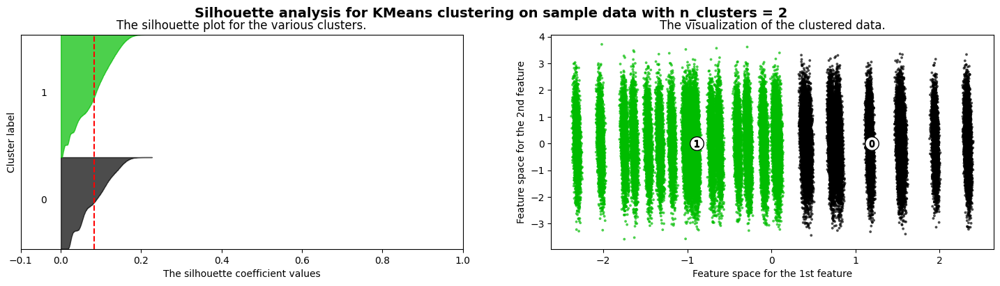

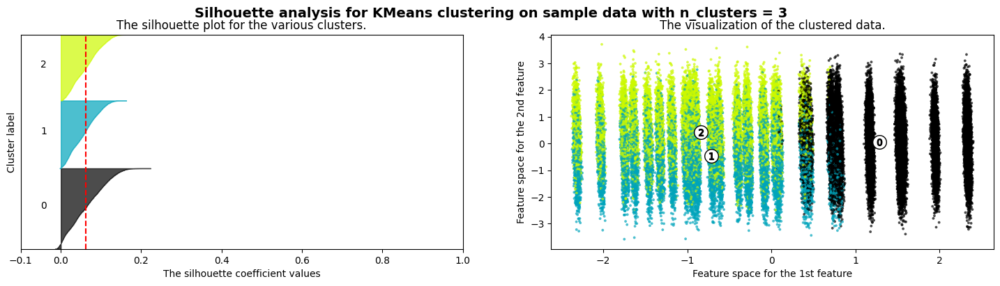

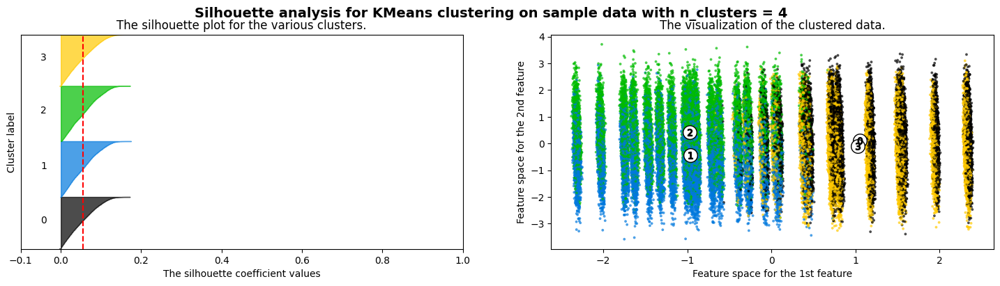

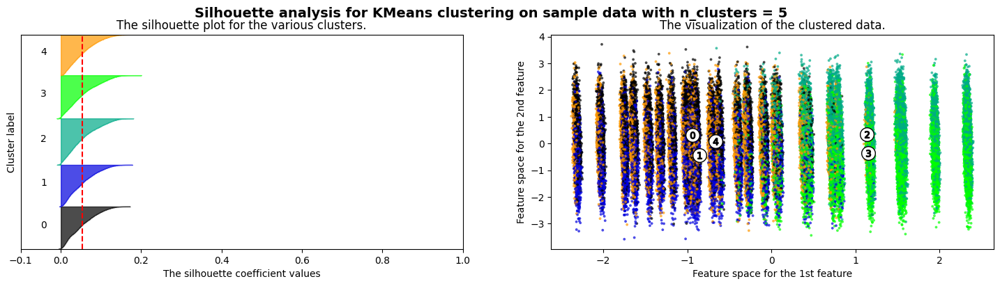

In [13]:
# Display the Silhouette Score and Plot Silhouette Plot

plot_silhouette(range(2, 6), data_scaled_pca, 3)

3

In [14]:
km = KMeans(n_clusters = 4, random_state = 3)
km.fit(data_scaled_pca)

KMeans(n_clusters=4, random_state=3)

In [15]:
pred = km.predict(data_scaled_pca)
pred

array([0, 0, 2, ..., 2, 0, 3])

In [16]:
# Insert clustering result into original dataset

data1['cluster'] = pred
data1

,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,cluster
0,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,33,32,22,2,0,14,66,0,2.63,0
1,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,34,34,13,14,100,12,61,2,1.72,0
2,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,37,27,6,3,50,10,1,0,3.17,2
3,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,52,10,28,12,100,10,0,1,1.86,3
4,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,38,11,29,13,100,15,9,1,1.25,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89985,IT,Female,56,Engineer,2024-07-04 08:03:05.556036,0,Bachelor,1,6600.0,57,29,27,14,75,5,22,1,4.01,3
89986,Finance,Male,27,Technician,2022-12-07 08:03:05.556036,1,Bachelor,4,4900.0,55,46,5,3,75,16,48,2,1.28,2
89987,Operations,Male,53,Analyst,2015-11-24 08:03:05.556036,8,High School,2,4800.0,31,13,6,5,0,5,87,1,2.60,2
89988,HR,Female,22,Consultant,2015-08-03 08:03:05.556036,9,High School,5,8250.0,35,43,10,1,75,2,31,1,3.10,0


In [17]:
# data1.to_csv('cluster_kmeans.csv',index=False)

<Axes: >

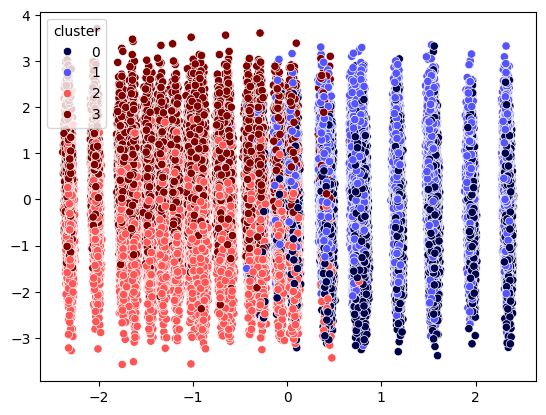

In [18]:
# Cluster visualization in 2D

pca_2d = PCA(n_components=2)
pca_2d.fit(data_scaled)

sales_scaled_pca_2d = pca_2d.fit_transform(data_scaled)

sns.scatterplot(x=sales_scaled_pca_2d[:,0], y=sales_scaled_pca_2d[:,1], hue=data1['cluster'], palette='seismic')

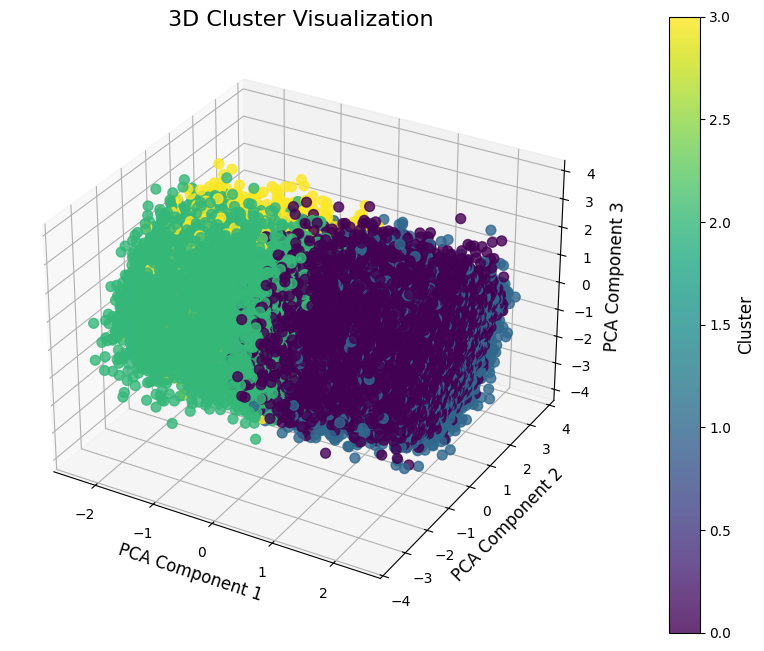

In [19]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Menggunakan PCA untuk mereduksi dimensi menjadi 3
pca_3d = PCA(n_components=3)
sales_scaled_pca_3d = pca_3d.fit_transform(data_scaled)

# Visualisasi scatter plot 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    sales_scaled_pca_3d[:, 0], 
    sales_scaled_pca_3d[:, 1], 
    sales_scaled_pca_3d[:, 2], 
    c=data1['cluster'], 
    cmap='viridis', 
    s=50, 
    alpha=0.8
)

# Menambahkan label untuk sumbu
ax.set_title('3D Cluster Visualization', fontsize=16)
ax.set_xlabel('PCA Component 1', fontsize=12)
ax.set_ylabel('PCA Component 2', fontsize=12)
ax.set_zlabel('PCA Component 3', fontsize=12)

# Menambahkan color bar
cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Cluster', fontsize=12)

plt.show()


In [20]:
import plotly.express as px
from sklearn.decomposition import PCA
import pandas as pd

# Melakukan PCA dengan 3 komponen
pca_3d = PCA(n_components=3)
sales_scaled_pca_3d = pca_3d.fit_transform(data_scaled)

# Membuat DataFrame hasil PCA
pca_df = pd.DataFrame(sales_scaled_pca_3d, columns=['PCA1', 'PCA2', 'PCA3'])
pca_df['Cluster'] = data1['cluster']

# Membuat scatter plot 3D interaktif
fig = px.scatter_3d(
    pca_df, 
    x='PCA1', 
    y='PCA2', 
    z='PCA3', 
    color='Cluster', 
    color_continuous_scale='Viridis',  # Ubah ke palet lain jika diinginkan
    title='3D Cluster Visualization',
    labels={'Cluster': 'Cluster Group'}
)

# Menambahkan pengaturan tampilan
fig.update_traces(marker=dict(size=5, opacity=0.8))
fig.update_layout(
    scene=dict(
        xaxis_title='PCA Component 1',
        yaxis_title='PCA Component 2',
        zaxis_title='PCA Component 3'
    )
)

# Menampilkan plot
fig.show()


In [21]:
# # Save the trained KMeans model
# with open('kmeans_model.pkl', 'wb') as f:
#   pickle.dump(km, f)

# # Save the StandardScaler
# with open('scaler.pkl', 'wb') as f:
#   pickle.dump(scaler, f)

# # Save the PCA model
# with open('pca.pkl', 'wb') as f:
#   pickle.dump(pca, f)

# Kproto 2

In [91]:
import pandas as pd
from kmodes.kprototypes import KPrototypes
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

In [92]:
data1 = pd.read_csv('data_clean.csv')

In [93]:
proto = data1.copy()
proto = proto.drop(['Hire_Date','Resigned','Employee_ID','Department','Gender','Job_Title'], axis=1)

In [94]:
num_columns = proto.select_dtypes(include = np.number).columns.tolist()
cat_columns = proto.select_dtypes(include = ['object']).columns.tolist()

In [95]:
proto_num = proto[num_columns]
proto_cat = proto[cat_columns]

print('Num Columns : ', num_columns)
print('Cat Columns : ', cat_columns)

Num Columns :  ['Age', 'Years_At_Company', 'Performance_Score', 'Monthly_Salary', 'Work_Hours_Per_Week', 'Projects_Handled', 'Overtime_Hours', 'Sick_Days', 'Remote_Work_Frequency', 'Team_Size', 'Training_Hours', 'Promotions', 'Employee_Satisfaction_Score']
Cat Columns :  ['Education_Level']


In [96]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(proto_num)

Text(0, 0.5, 'Eigenvalues')

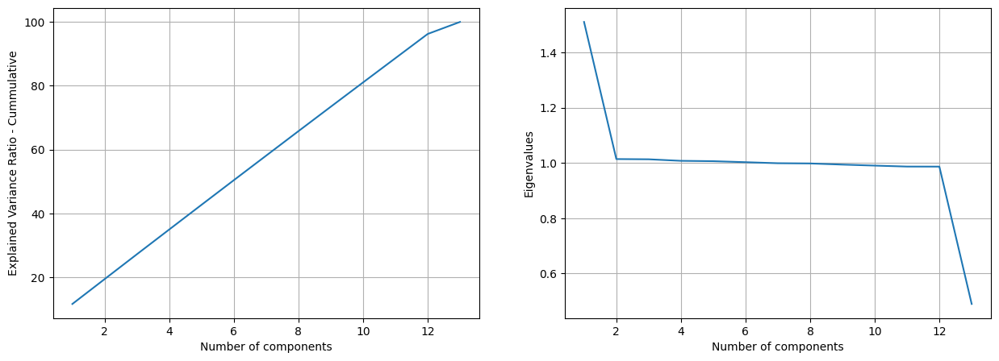

In [97]:
# Dimensionality Reduction using PCA
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(data_scaled)

# Plot the Cummulative of Explained Variance Ratio
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(range(1, 14), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained Variance Ratio - Cummulative')

# Plot the Eigenvalues
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(range(1, 14), pca.explained_variance_ )
plt.xlabel('Number of components')
plt.ylabel('Eigenvalues')

In [98]:
# Check the number of features if we want to retain 95 % of the information

cumsum = np.cumsum(pca.explained_variance_ratio_)
num_features = np.argmax(cumsum >= 0.70) + 1
num_features

9

In [99]:
# Let's train the model with 95 % of the original dataset information

pca = PCA(n_components=9)
pca.fit(data_scaled)

proto_num_scaled_pca = pca.transform(data_scaled)

In [100]:
# Concate columns

proto_df_final = np.concatenate([proto_num_scaled_pca, proto_cat], axis=1)
proto_df_final = pd.DataFrame(proto_df_final, columns=[['PCA1', 'PCA2', 'PCA3', 'PCA4','PCA5','PCA6','PCA7','PCA8','PCA9'] + cat_columns])
proto_df_final = proto_df_final.infer_objects()
proto_df_final

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,Education_Level
0,1.189447,0.563717,0.906726,-1.064547,0.695692,0.935619,0.790629,0.310702,0.591383,High School
1,1.575399,-1.097924,-1.287782,-1.366460,-0.796941,-1.717398,0.000079,1.045166,1.631879,High School
2,-0.259470,-0.170450,-0.209527,-0.337523,0.910513,2.628200,-0.100004,0.521897,-0.795163,High School
3,-1.328077,-0.735473,1.386064,0.500126,-0.918682,0.029316,-1.165547,0.624262,0.815264,Bachelor
4,-1.321879,-1.053227,0.493071,-0.353486,-0.934710,-0.713933,-1.261243,1.910536,1.845980,Bachelor
...,...,...,...,...,...,...,...,...,...,...
99995,-0.315710,0.739968,-2.111049,0.763234,-0.636692,-0.950763,-0.010826,0.592176,0.838687,Bachelor
99996,1.947765,1.271933,-0.983438,0.215375,0.490921,1.028839,1.121073,-0.482422,-0.390000,Master
99997,-1.293584,-0.659861,0.227619,-0.268561,-0.579075,1.890692,1.957974,-0.592009,-0.599984,High School
99998,1.949818,1.001110,-2.260983,-0.057575,0.354695,1.776505,-0.609434,-0.977283,0.890887,High School


In [101]:
# Get the position of categorical columns

index_cat_columns = [proto_df_final.columns.get_loc(col) for col in list(proto_df_final.select_dtypes('object').columns)]

print('Categorical columns        : ', cat_columns)
print('Categorical columns index  : ', index_cat_columns)

Categorical columns        :  ['Education_Level']
Categorical columns index  :  [9]


Cluster creation :  2
Cluster creation :  3
Cluster creation :  4
Cluster creation :  5


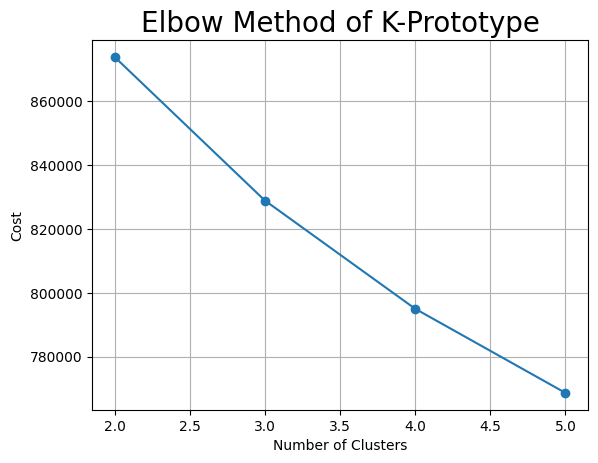

In [102]:
# Find the optimal number of clusters using Elbow Method
# %%time
from kmodes.kprototypes import KPrototypes

max_clusters = 5
cost = []
for k in range(2, max_clusters+1):
  kproto = KPrototypes(n_clusters=k, init='Huang', random_state=42, n_jobs=-1)
  kproto.fit_predict(proto_df_final, categorical=index_cat_columns)
  cost.append(kproto.cost_)
  print('Cluster creation : ', k)

plt.plot(range(2, max_clusters+1), cost, marker ="o")
plt.grid()
plt.title('Elbow Method of K-Prototype', fontsize = 20)
plt.xlabel('Number of Clusters')
plt.ylabel('Cost')
plt.show()

In [103]:
# Train with optimal number of clusters

# %%time
kp = KPrototypes(n_clusters=4, random_state=42)
pred = kp.fit_predict(proto_df_final, categorical=index_cat_columns)
pred

array([0, 2, 0, ..., 1, 0, 3], dtype=uint16)

In [104]:
# Insert clustering result into original dataset

data1['cluster'] = pred
data1

,Employee_ID,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,...,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,Resigned,cluster
0,1,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,...,32,22,2,0,14,66,0,2.63,False,0
1,2,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,...,34,13,14,100,12,61,2,1.72,False,2
2,3,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,...,27,6,3,50,10,1,0,3.17,False,0
3,4,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,...,10,28,12,100,10,0,1,1.86,False,1
4,5,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,...,11,29,13,100,15,9,1,1.25,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99996,Finance,Male,27,Technician,2022-12-07 08:03:05.556036,1,Bachelor,4,4900.0,...,46,5,3,75,16,48,2,1.28,False,1
99996,99997,IT,Female,36,Consultant,2018-07-24 08:03:05.556036,6,Master,5,8250.0,...,35,7,0,0,10,77,1,3.48,True,2
99997,99998,Operations,Male,53,Analyst,2015-11-24 08:03:05.556036,8,High School,2,4800.0,...,13,6,5,0,5,87,1,2.60,False,1
99998,99999,HR,Female,22,Consultant,2015-08-03 08:03:05.556036,9,High School,5,8250.0,...,43,10,1,75,2,31,1,3.10,False,0


<Axes: >

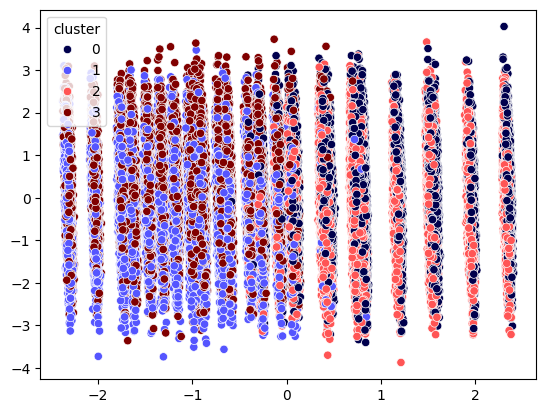

In [105]:
# Cluster visualization in 2D

pca_2d = PCA(n_components=2)
pca_2d.fit(data_scaled)

sales_scaled_pca_2d = pca_2d.fit_transform(data_scaled)

sns.scatterplot(x=sales_scaled_pca_2d[:,0], y=sales_scaled_pca_2d[:,1], hue=data1['cluster'], palette='seismic')